## Description

In Sub-Saharan Africa, it is estimated that crop diseases and pests can reduce yields by up to 40% annually, with significant impacts on the food security and the economy of the region. This is a major concern, considering that agriculture employs more than 60% of the population and accounts for about 23% of the region's GDP.

Crop diseases are on the rise, exacerbated by climate change and the lack of access to advanced agricultural technologies. Diseases like tomato leaf curl virus and pepper blight have significantly impacted the yields of these essential crops.

The objective of this challenge is to develop robust machine learning models that can accurately predict all diseases present in images of corn, pepper, and tomato crops. Participants are tasked with creating models that can a) generalise well, even when encountering new diseases not seen in the training set, and b) operate efficiently on edge devices such as the entry-level smartphones used by most subsistence farmers in Africa.

By harnessing the power of machine learning, we aim to develop advanced solutions for detecting and identifying multiple diseases in three vital crops: corn, pepper, and tomatoes. The models and solutions developed in this challenge will support accurate and timely disease detection, enhance agricultural productivity and sustainability, and ensure food security for millions of people.

[More about the challenge and the data here](https://zindi.africa/competitions/ghana-crop-disease-detection-challenge)

![](https://media.licdn.com/dms/image/C4E12AQGdq3-XWXwtJg/article-cover_image-shrink_720_1280/0/1520042039099?e=2147483647&v=beta&t=-cngYgmiA1pTdrR7gBK-1JJ9rbMkXAsRlUrOX3uF1Rs)

## Libraries

In [1]:
# !pip install pyspark pyarrow

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
pd.set_option('max_colwidth', 1000)
import os, random, sys
from tqdm import tqdm
tqdm.pandas()

from IPython.core.display import HTML
from IPython.display import Image
from collections import Counter
import json


from plotly.offline import init_notebook_mode, iplot
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from wordcloud import WordCloud
from plotly import tools
import seaborn as sns
from PIL import Image

import tensorflow as tf

init_notebook_mode(connected=True)
%matplotlib inline 

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import cv2


import multiprocessing
from pathlib import Path
import shutil
# import pyspark.pandas as ps

## Reading Data

In [3]:
ss = pd.read_csv("/kaggle/input/gcddc-data/ghana-crop-disease-detection-challenge20241003-7123-59ht2i/SampleSubmission.csv")
test =pd.read_csv("/kaggle/input/gcddc-data/ghana-crop-disease-detection-challenge20241003-7123-59ht2i/Test.csv")
train = pd.read_csv("/kaggle/input/gcddc-data/ghana-crop-disease-detection-challenge20241003-7123-59ht2i/Train.csv")
images_path = "/kaggle/input/gcddc-data/images"

In [4]:
train.head()

,Image_ID,confidence,class,ymin,xmin,ymax,xmax
0,id_11543h.jpg,1.0,Pepper_Bacterial_Spot,194.649671,328.803454,208.107730,341.967928
1,id_11543h.jpg,1.0,Pepper_Bacterial_Spot,149.632401,256.768914,162.910362,266.195724
2,id_11543h.jpg,1.0,Pepper_Bacterial_Spot,234.046875,327.138158,252.712993,338.876645
3,id_11543h.jpg,1.0,Pepper_Bacterial_Spot,221.277138,340.411184,238.593750,354.651316
4,id_11ee1c.jpg,1.0,Pepper_Fusarium,2000.563598,989.588908,2184.252196,1401.748952


## Descriptive Statistics

### How many images and labels

In [5]:
print ("Total Images in the train:", train.Image_ID.nunique())
print ("Total Labels in the train:", train["class"].nunique())
print ("")

print ("Total Images in the test:", test.Image_ID.nunique())
print ("Total Labels in the test:", 0)
print ("")

Total Images in the train: 4902
Total Labels in the train: 23

Total Images in the test: 2101
Total Labels in the test: 0



We have **4902** images with **23** distinct labels in the train set, and **2101** images in the test set.

### Classes frequency distribution

In [6]:
train_labels = Counter(train["class"])

xvalues = list(train_labels.keys())
yvalues = list(train_labels.values())

trace1 = go.Bar(x=xvalues, y=yvalues, opacity=0.8, name="Diseases count", marker=dict(color='rgba(20, 20, 20, 1)'))
layout = dict(width=800, title='Distribution of different labels in the train dataset', legend=dict(orientation="h"));

fig = go.Figure(data=[trace1], layout=layout);
iplot(fig);

- The most frequent labels are: `Corn_Cercospora_Leaf_Spot`, `Tomato_Septoria`, `Tomato_Late_Blight`
- The least frequent are: `Corn_Northern_Leaf_Blight`, `Tomato_Mosaic`, and `Pepper_Early_Blight`

In [7]:
# most common labels 

temps = train_labels.most_common(10)
labels_tr = [""+str(x[0]) for x in temps]
values = [x[1] for x in temps]

trace1 = go.Bar(x=labels_tr, y=values, opacity=0.7, name="Disease count", marker=dict(color='rgba(120, 120, 120, 0.8)'))
layout = dict(height=400, title='Top 10 Labels in the train dataset', legend=dict(orientation="h"));

fig = go.Figure(data=[trace1], layout=layout);
iplot(fig);

### Number of annotation per plant types

In [8]:
train["plant"] = train["class"].apply(lambda x: x.split("_")[0])
train["disease"] = train["class"].apply(lambda x: "_".join(x.split("_")[1:]))

In [9]:
train.groupby("plant").agg({'Image_ID': ['nunique', 'count'], 'disease': ['nunique', "unique"]})

Image_ID        disease  \
        nunique  count nunique   
plant                            
Corn       1409  13128       5   
Pepper     2365  10745      10   
Tomato     1281  17156       8   

                                                                                                                                   
                                                                                                                           unique  
plant                                                                                                                              
Corn                                                   [Cercospora_Leaf_Spot, Common_Rust, Streak, Healthy, Northern_Leaf_Blight]  
Pepper  [Bacterial_Spot, Fusarium, Septoria, Leaf_Curl, Leaf_Mosaic, Healthy, Late_Blight, Cercospora, Leaf_Blight, Early_Blight]  
Tomato                                [Early_Blight, Septoria, Healthy, Late_Blight, Fusarium, Leaf_Curl, Bacterial_Spot, Mosaic]

+ In our train dataset, among `4902` images available:

- `1409` of them correspond to corn plants
- `2365` correspond to pepper plants
- `1281` come from tomato plants

+ Despite that tomato crops are the least present within our dataset, it is the one with most annotations (**17156**), and the the crop with the most images, pepper, is the one with the least annotations (only **10745**).

+ The divergence in the number of annotations vs the number of images available could be explained by the fact that there are twice more diseases detected in pepper plants than in corn plants.


In [10]:
pd.crosstab(train.plant, train.disease).T

plant,Corn,Pepper,Tomato
disease,,,
Bacterial_Spot,0,1943,484
Cercospora,0,472,0
Cercospora_Leaf_Spot,6538,0,0
Common_Rust,1682,0,0
Early_Blight,0,101,1946
Fusarium,0,472,882
Healthy,1571,736,2872
Late_Blight,0,575,3918
Leaf_Blight,0,508,0


- Diseases related to corn plants are mainly: `Cercospora leaf spot`(6538), `common rust`(1682), `northern leaf blight`(157), and `streak`(3180).
- Diseases only found on pepper plants are: `Cercospora`(472), `leaf blight`(508), and `leaf mosaic`(2113)
- Diseases only related to tomato plants are: `Mosaic`(134)
- Diseases found on both pepper and tomato plants: `Bacterial spot`, `Early blight`, `Fusarium`, `Late blight`, `Leaf curl`, and `Septoria`

### On a given image, how many plants are there?

In [11]:
train.groupby("Image_ID")["plant"].nunique().value_counts()

plant
1    4749
2     153
Name: count, dtype: int64

Within our training set, there are `4749` images with only one plant, whereas there are `153` images with two plants.

In [12]:
images_with_two_plants = train.groupby("Image_ID")["plant"].nunique()[train.groupby("Image_ID")["plant"].nunique()==2].index.tolist()

In [13]:
train.loc[train.Image_ID.isin(images_with_two_plants)].groupby("Image_ID")['plant'].unique().apply(lambda x: sorted(x)).value_counts()

plant
[Pepper, Tomato]    153
Name: count, dtype: int64

The images with two crops cultivated contains only te pair: `Pepper` and `Tomato`. This could be explained by te fact they are probably usually cultivated together and they are subject to catch similar diseases.

### On a given image, how many diseases are there?

In [14]:
train.groupby("Image_ID")["disease"].nunique().value_counts()

disease
1    3923
2     873
3     101
4       5
Name: count, dtype: int64

Within our training set, there are `3923` images with only one disease detected, whereas there are `873` images with two diseases detected, `101` images with 3 diseases detected, and `5` images with 4 diseases detected.

In [15]:
images_with_two_disease = train.groupby("Image_ID")["disease"].nunique()[train.groupby("Image_ID")["disease"].nunique() == 2].index.tolist()

In [16]:
train.loc[train.Image_ID.isin(images_with_two_disease)].groupby("Image_ID")['disease'].unique().apply(lambda x: sorted(x)).value_counts()

disease
[Cercospora_Leaf_Spot, Common_Rust]             131
[Late_Blight, Septoria]                         125
[Cercospora_Leaf_Spot, Healthy]                  78
[Leaf_Curl, Leaf_Mosaic]                         70
[Bacterial_Spot, Leaf_Mosaic]                    66
[Cercospora_Leaf_Spot, Streak]                   51
[Early_Blight, Late_Blight]                      39
[Northern_Leaf_Blight, Streak]                   35
[Fusarium, Healthy]                              23
[Healthy, Leaf_Curl]                             20
[Leaf_Blight, Leaf_Curl]                         19
[Fusarium, Late_Blight]                          18
[Leaf_Blight, Leaf_Mosaic]                       17
[Cercospora, Leaf_Curl]                          16
[Cercospora, Leaf_Blight]                        14
[Bacterial_Spot, Leaf_Curl]                      14
[Leaf_Curl, Mosaic]                              14
[Common_Rust, Healthy]                           13
[Bacterial_Spot, Late_Blight]                    13
[Cer

In [17]:
labels_tr = [" ".join(x) for x in train.loc[train.Image_ID.isin(images_with_two_disease)].groupby("Image_ID")['disease'].unique().apply(lambda x: sorted(x)).value_counts().index.tolist()]
values = train.loc[train.Image_ID.isin(images_with_two_disease)].groupby("Image_ID")['disease'].unique().apply(lambda x: sorted(x)).value_counts().values

trace1 = go.Bar(x=labels_tr, y=values, opacity=0.7, name="Disease count", marker=dict(color='rgba(120, 120, 120, 0.8)'))
layout = dict(height=600, title='Images with two diseases in the train dataset', legend=dict(orientation="h"));

fig = go.Figure(data=[trace1], layout=layout);
iplot(fig);

In [18]:
images_with_three_disease = train.groupby("Image_ID")["disease"].nunique()[train.groupby("Image_ID")["disease"].nunique() == 3].index.tolist()
labels_tr = [" ".join(x) for x in train.loc[train.Image_ID.isin(images_with_three_disease)].groupby("Image_ID")['disease'].unique().apply(lambda x: sorted(x)).value_counts().index.tolist()]
values = train.loc[train.Image_ID.isin(images_with_three_disease)].groupby("Image_ID")['disease'].unique().apply(lambda x: sorted(x)).value_counts().values

trace1 = go.Bar(x=labels_tr, y=values, opacity=0.7, name="Disease count", marker=dict(color='rgba(120, 120, 120, 0.8)'))
layout = dict(height=600, title='Images with three diseases in the train dataset', legend=dict(orientation="h"));

fig = go.Figure(data=[trace1], layout=layout);
iplot(fig);

In [19]:
images_with_four_disease = train.groupby("Image_ID")["disease"].nunique()[train.groupby("Image_ID")["disease"].nunique() == 4].index.tolist()
labels_tr = [" ".join(x) for x in train.loc[train.Image_ID.isin(images_with_four_disease)].groupby("Image_ID")['disease'].unique().apply(lambda x: sorted(x)).value_counts().index.tolist()]
values = train.loc[train.Image_ID.isin(images_with_four_disease)].groupby("Image_ID")['disease'].unique().apply(lambda x: sorted(x)).value_counts().values

trace1 = go.Bar(x=labels_tr, y=values, opacity=0.7, name="Disease count", marker=dict(color='rgba(120, 120, 120, 0.8)'))
layout = dict(height=600, title='Images with four diseases in the train dataset', legend=dict(orientation="h"));

fig = go.Figure(data=[trace1], layout=layout);
iplot(fig);

## Images Analysis

### Sample images visualisation

#### Crops Types

In [20]:
def show_crop_images(ids, title):
    nrow = 1
    ncol = len(ids) 
    plt.figure(figsize=(14, 10))
    for index, id_ in enumerate(ids):
        image = cv2.imread(f"{images_path}/{train.Image_ID[id_]}") # Reading Image File

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # This image will be in BGR fromate, we will convert this into RG
        
        plt.subplot(nrow, ncol, index+1)
        plt.axis("off")
        plt.imshow(image) # Display Image File
        plt.title(f"{train['plant'][id_]}", fontsize=8)
    plt.suptitle(title, y=0.65)
    plt.tight_layout()
    plt.show()

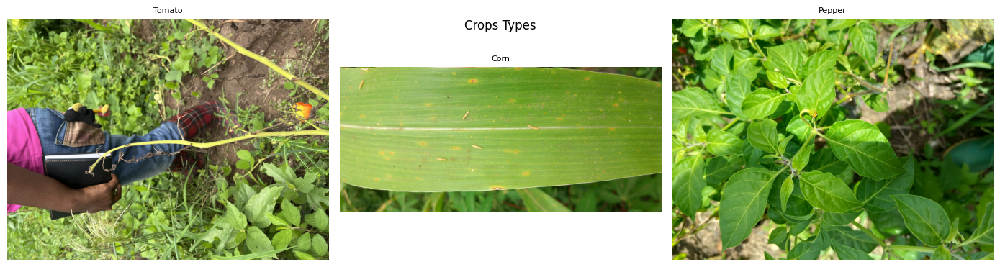

In [21]:
sple_crops_ids = [random.choice(train.loc[train.plant=="Tomato"].Image_ID.index),
             random.choice(train.loc[train.plant=="Corn"].Image_ID.index),
             random.choice(train.loc[train.plant=="Pepper"].Image_ID.index)]
sple_label = "Crops Types"
show_crop_images(sple_crops_ids, sple_label)

#### Diseases in Tomatoes crops

In [22]:
def show_diseases_in_crops_images(ids, title):
    nrow = 1
    ncol = len(ids) 
    plt.figure(figsize=(20, 18))
    for index, id_ in enumerate(ids):
        image = cv2.imread(f"{images_path}/{train.Image_ID[id_]}") # Reading Image File

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # This image will be in BGR fromate, we will convert this into RG
        
        plt.subplot(nrow, ncol, index+1)
        plt.axis("off")
        plt.imshow(image) # Display Image File
        plt.title(f"{train['disease'][id_]}", fontsize=8)
    plt.suptitle(title, y=0.60)
    plt.tight_layout()
    plt.show()

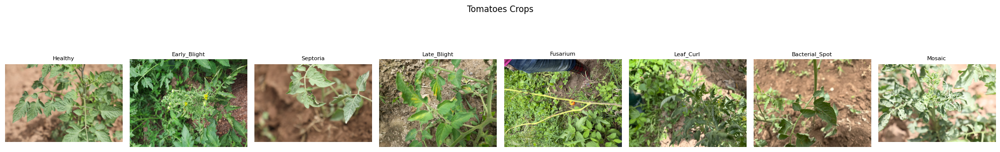

In [23]:
sple_crops_ids = [random.choice(train.loc[((train.disease==disease) & (train.plant=="Tomato"))].Image_ID.index) for disease in 
                  ["Healthy", "Early_Blight", "Septoria", "Late_Blight", "Fusarium", "Leaf_Curl", "Bacterial_Spot", "Mosaic"]]
sple_label = "Tomatoes Crops"
show_diseases_in_crops_images(sple_crops_ids, sple_label)

#### Diseases in Corn Crops

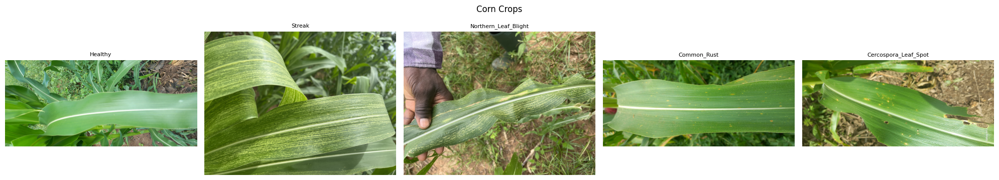

In [24]:
sple_crops_ids = [random.choice(train.loc[((train.disease==disease) & (train.plant=="Corn"))].Image_ID.index) for disease in 
                  ["Healthy", "Streak", "Northern_Leaf_Blight", "Common_Rust", "Cercospora_Leaf_Spot"]]
sple_label = "Corn Crops"
show_diseases_in_crops_images(sple_crops_ids, sple_label)

#### Diseases in Pepepr Crops

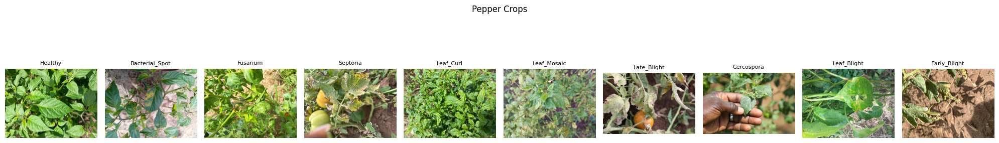

In [25]:
sple_crops_ids = [random.choice(train.loc[((train.disease==disease) & (train.plant=="Pepper"))].Image_ID.index) for disease in 
                  ["Healthy", "Bacterial_Spot", "Fusarium", "Septoria", "Leaf_Curl", "Leaf_Mosaic", "Late_Blight", "Cercospora", "Leaf_Blight", "Early_Blight"]]
sple_label = "Pepper Crops"
show_diseases_in_crops_images(sple_crops_ids, sple_label)

### Distribution of Colors

In [26]:
def load_image(image_name, label, do_show=False):  # Load the given image

    image = cv2.imread(images_path+"/"+image_name)  
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # This image will be in BGR format, we will convert this into RGB 
    image = cv2.resize(image, (4032, 4032), interpolation = cv2.INTER_AREA)
    if do_show:
        
        plt.figure()
        plt.axis("off")
        plt.title(label)
        plt.imshow(image) # Display the image using matplotlib
    
    return image

In [27]:
def image_list_pixelation(image): # We Will Generate K-Means Clusters from n number of data points, so our image of MxN shape are our Data Points
    
    image = image.reshape((image.shape[0]*image.shape[1], 3)) # We need to re-shape our image to be a list of pixels, instead of MxN Matrix of Pixels
    
    return image # Return the Image
     

In [28]:
def k_means_clustering(image, cluster): # Apply K-Means from sklearn library

    clt = KMeans(n_clusters = cluster, n_init="auto")
    clt.fit(image)

    return clt # Return the Clusters

In [29]:
def centroid_histogram(clt): # Grab the Number of Different Clusters and Create a Histogram, based on the Number of Pixels assigned to each Cluster

    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    hist,_ = np.histogram(clt.labels_, bins = numLabels) # Normalize the Histogram
    hist = hist.astype("float")
    hist/=hist.sum()

    return hist # Return the Histogram

In [30]:
Percent = [] # List used to Store Percentages of Colors

def plot_colors(hist, centroids): 
    Percent.clear()
    bar = np.zeros((50, 300, 3), dtype = "uint8") # Initialize the Chart representing the Relative Frequency of Each Color
    startX = 0 

    for (percent, color) in zip(hist, centroids): # Loop over the Percentage of each Cluster and the color of each Cluster      
        endX = startX + (percent * 300) # Plot the relative percentage of each Cluster
        cv2.rectangle(bar, (int(startX), 0), (int(endX), 50), color.astype("uint8").tolist(), -1)
        startX = endX
        Percent.append(round(percent*100,2))

    return bar # Return the Bar Chart

In [31]:
def apply_color_clustering(image_name, label, cluster):

    image = load_image(image_name, label, do_show=True) # Load the given Image   
    image = image_list_pixelation(image) # Convert Image Matrix to list of Pixels
  
    clt = k_means_clustering(image, cluster)   # Apply K-Means Clustering    
    hist = centroid_histogram(clt) # Build a histogram of clusters, then a figure representing the number of pixels labeled to each Color
    bar = plot_colors(hist, clt.cluster_centers_)

    plt.figure()
    plt.axis("off")
    plt.title(f"Cluster of Colors {image_name} {label}")
    plt.imshow(bar)
    plt.show()  # Display Cluster of Colors

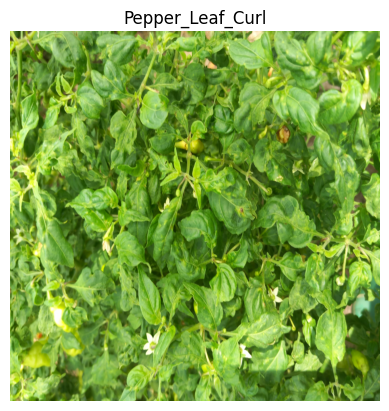

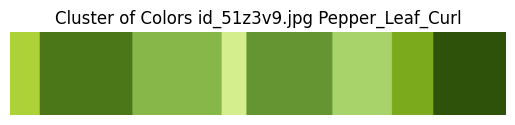

Percentage Distribution of Color in Image:  [6.19, 18.78, 17.82, 5.06, 17.19, 12.23, 8.22, 14.51]


In [32]:
id_ = random.randint(0, train.shape[0])

image_name = train.Image_ID[id_] # Choose pre-loaded image 1

cluster = 8 # Provide number of color clusters we want to display

apply_color_clustering(image_name, train["class"][id_], cluster) # Apply Clustering for Color Distribution

print("Percentage Distribution of Color in Image: ", Percent)

### How colors are distributed by crops types and diseases

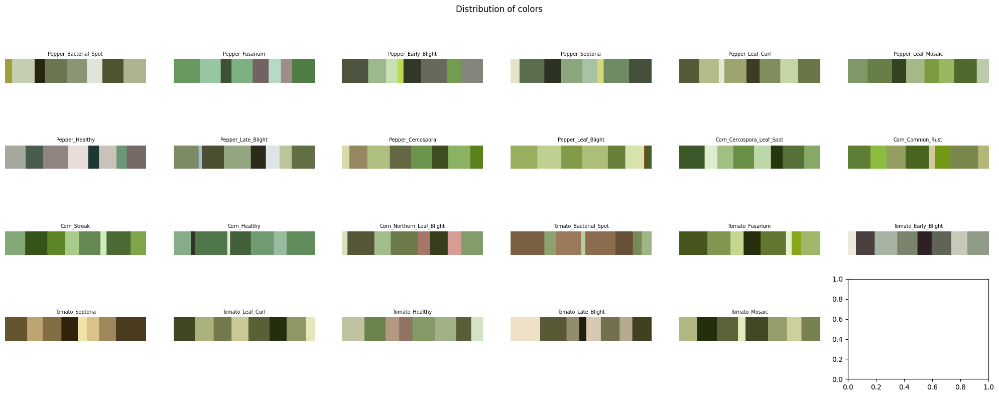

In [33]:
plt.figure(figsize=(20, 8))
ind = 1
for i, crop in enumerate(train.plant.unique()):
    for j, disease in enumerate(train.disease.unique()):
        plt.subplot(4, 6, ind)
        try:
            sple_image_id = random.choice(train.loc[((train.plant==crop) & (train.disease==disease))].index.tolist())
            sple_image_name = train.Image_ID[sple_image_id]
            sple_image_label = train["class"][sple_image_id]
            sple_image = load_image(sple_image_name, sple_image_label, do_show=False) # Load the given Image   
            sple_image = image_list_pixelation(sple_image) # Convert Image Matrix to list of Pixels

            clt = k_means_clustering(sple_image, cluster)   # Apply K-Means Clustering    
            hist = centroid_histogram(clt) # Build a histogram of clusters, then a figure representing the number of pixels labeled to each Color
            bar = plot_colors(hist, clt.cluster_centers_)
            plt.axis("off")
            plt.title(f"{sple_image_label}", fontsize=7)
            plt.imshow(bar)
            ind += 1
        except IndexError:
            pass
plt.suptitle("Distribution of colors")
plt.tight_layout()
plt.show()  # Display Cluster of Colors

### Images dimensions

In [34]:
# Map str classes to ints (label encoding targets)
class_mapper = {x:y for x,y in zip(sorted(train['class'].unique().tolist()), range(train['class'].nunique()))}
train['class_id'] = train['class'].map(class_mapper)
train["image_path"] = train["Image_ID"].apply(lambda x: f"/kaggle/input/gcddc-data/images/{x}")
test["image_path"] = test["Image_ID"].apply(lambda x: f"/kaggle/input/gcddc-data/images/{x}")

In [35]:
DATASET_DIR = Path('/kaggle/working/')
# Labels directories
LABELS_DIR = DATASET_DIR / 'labels'
DIMENSIONS_DIR = DATASET_DIR / 'dimensions'
TEST_DIMENSIONS_DIR = DATASET_DIR / 'test/dimensions'


In [36]:

# Function to convert the bboxes to YOLO format
def convert_to_yolo(bbox, width, height):
    ymin, xmin, ymax, xmax = bbox['ymin'], bbox['xmin'], bbox['ymax'], bbox['xmax']
    class_id = bbox['class_id']

    # Normalize the coordinates
    x_center = (xmin + xmax) / 2 / width
    y_center = (ymin + ymax) / 2 / height
    bbox_width = (xmax - xmin) / width
    bbox_height = (ymax - ymin) / height

    return f"{class_id} {x_center:.6f} {y_center:.6f} {bbox_width:.6f} {bbox_height:.6f}"

# Top-level function to save annotations for a single image
def save_yolo_annotations_task(task):
    image_path, bboxes, output_dir = task
    try:
        img = np.array(Image.open(str(image_path)))
        height, width, _ = img.shape
    except Exception as e:
        print(f"Error opening image {image_path}: {e}")
        return

    label_file = Path(output_dir) / f"{Path(image_path).stem}.txt"
    with open(label_file, 'w') as f:
        for bbox in bboxes:
            annotation = convert_to_yolo(bbox, width, height)
            f.write(f"{annotation}\n")

# Function to clear output directory
def clear_output_dir(output_dir):
    if Path(output_dir).exists():
        shutil.rmtree(output_dir)
    Path(output_dir).mkdir(parents=True, exist_ok=True)

# Function to process the dataset and save annotations
def process_dataset(dataframe, output_dir):
    # Clear the output directory to prevent duplicate annotations
    clear_output_dir(output_dir)

    # Group the DataFrame by 'image_path'
    grouped = dataframe.groupby('image_path')
    tasks = [(image_path, group.to_dict('records'), output_dir) for image_path, group in grouped]

    # Use multiprocessing Pool to process tasks
    with multiprocessing.Pool() as pool:
        list(tqdm(pool.imap_unordered(save_yolo_annotations_task, tasks), total=len(tasks)))


# Save train and validation labels to their respective dirs
process_dataset(train, LABELS_DIR)

100%|██████████| 4902/4902 [03:10<00:00, 25.77it/s]


In [37]:
# Top-level function to save annotations for a single image
def save_height_and_width_task(task):
    image_path, bboxes, output_dir = task
    try:
        img = np.array(Image.open(str(image_path)))
        height, width, _ = img.shape
    except Exception as e:
        print(f"Error opening image {image_path}: {e}")
        return

    label_file = Path(output_dir) / f"{Path(image_path).stem}.txt"
    with open(label_file, 'w') as f:
        for bbox in bboxes:
            annotation = f"{image_path.split('/')[-1]} {height} {width}"
            f.write(f"{annotation}\n")
            break

# Function to clear output directory
def clear_output_dir(output_dir):
    if Path(output_dir).exists():
        shutil.rmtree(output_dir)
    Path(output_dir).mkdir(parents=True, exist_ok=True)

# Function to process the dataset and save annotations
def process_dataset2(dataframe, output_dir):
    # Clear the output directory to prevent duplicate annotations
    clear_output_dir(output_dir)

    # Group the DataFrame by 'image_path'
    grouped = dataframe.groupby('image_path')
    tasks = [(image_path, group.to_dict('records'), output_dir) for image_path, group in grouped]

    # Use multiprocessing Pool to process tasks
    with multiprocessing.Pool() as pool:
        list(tqdm(pool.imap_unordered(save_height_and_width_task, tasks), total=len(tasks)))


# Save train and validation labels to their respective dirs
process_dataset2(train, DIMENSIONS_DIR)

100%|██████████| 4902/4902 [02:51<00:00, 28.61it/s]


In [38]:
dimension_files = [f"/kaggle/working/dimensions/{f}" for f in os.listdir("/kaggle/working/dimensions")]

In [39]:
images_dims = [pd.read_table(f, header=None).iloc[0].values[0].split() for f in tqdm(dimension_files)]

100%|██████████| 4902/4902 [00:05<00:00, 858.83it/s]


In [40]:
train = pd.merge(train, pd.DataFrame(images_dims, columns = ["Image_ID", "height", "width"]), on="Image_ID")

In [41]:
process_dataset2(test, TEST_DIMENSIONS_DIR)

100%|██████████| 2101/2101 [01:16<00:00, 27.37it/s]


In [42]:
test_dimension_files = [f"/kaggle/working/test/dimensions/{f}" for f in os.listdir("/kaggle/working/test/dimensions")]
test_images_dims = [pd.read_table(f, header=None).iloc[0].values[0].split() for f in tqdm(test_dimension_files)]
test = pd.merge(test, pd.DataFrame(test_images_dims, columns = ["Image_ID", "height", "width"]), on="Image_ID")

100%|██████████| 2101/2101 [00:02<00:00, 815.75it/s]


In [43]:
train.height = train.height.astype(int)
train.width = train.width.astype(int)

test.height = test.height.astype(int)
test.width = test.width.astype(int)

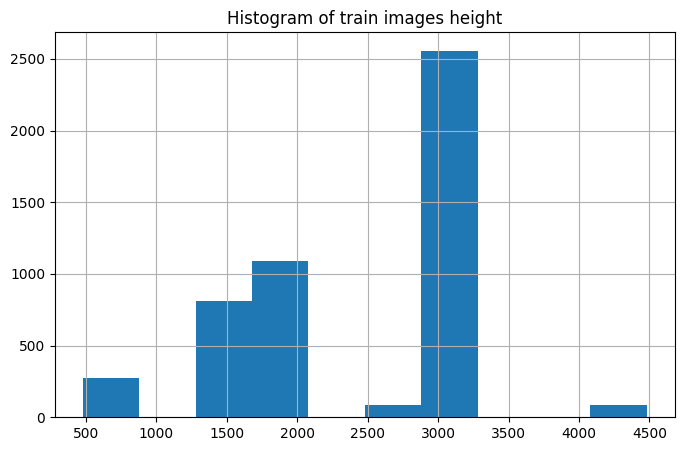

In [44]:
plt.figure(figsize=(8,5))
train.drop_duplicates(subset="Image_ID").height.hist()
plt.title("Histogram of train images height")
plt.show()

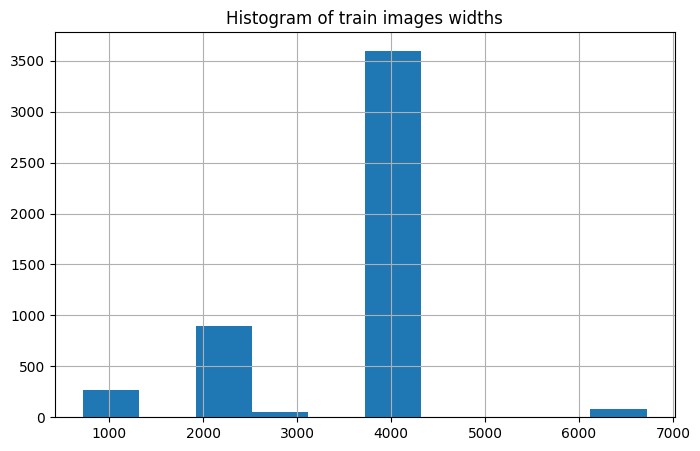

In [45]:
plt.figure(figsize=(8,5))
train.drop_duplicates(subset="Image_ID").width.hist()
plt.title("Histogram of train images widths")
plt.show()

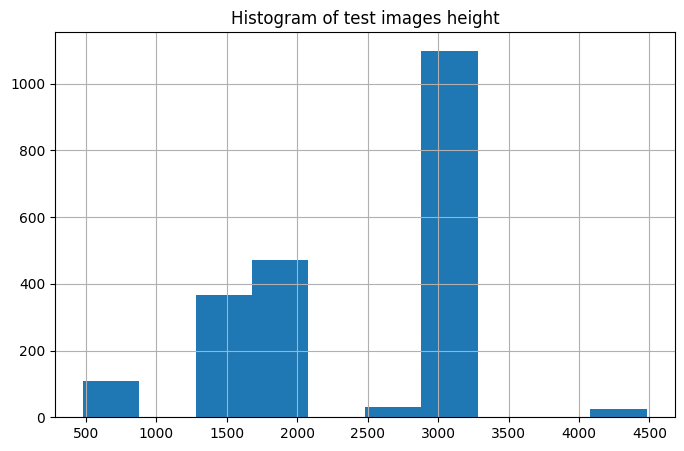

In [46]:
plt.figure(figsize=(8,5))
test.drop_duplicates(subset="Image_ID").height.hist()
plt.title("Histogram of test images height")
plt.show()

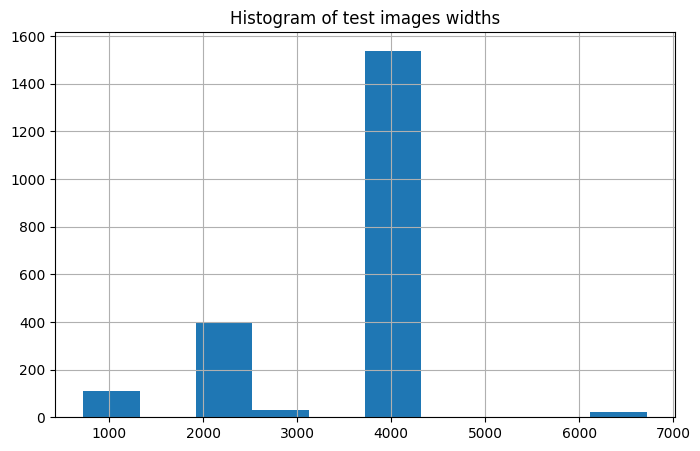

In [47]:
plt.figure(figsize=(8,5))
test.drop_duplicates(subset="Image_ID").width.hist()
plt.title("Histogram of test images widths")
plt.show()

## Object Detection: Bounding Boxes

### Sample bounding boxes visualization

Plotting id_p8dxgn.jpg with 9 bounding boxes.


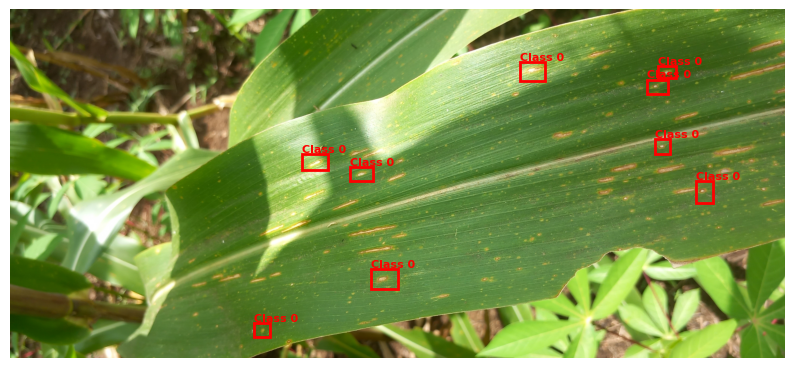

No annotations found for id_g2syp1.jpg.
Plotting id_zx8php.jpg with 11 bounding boxes.


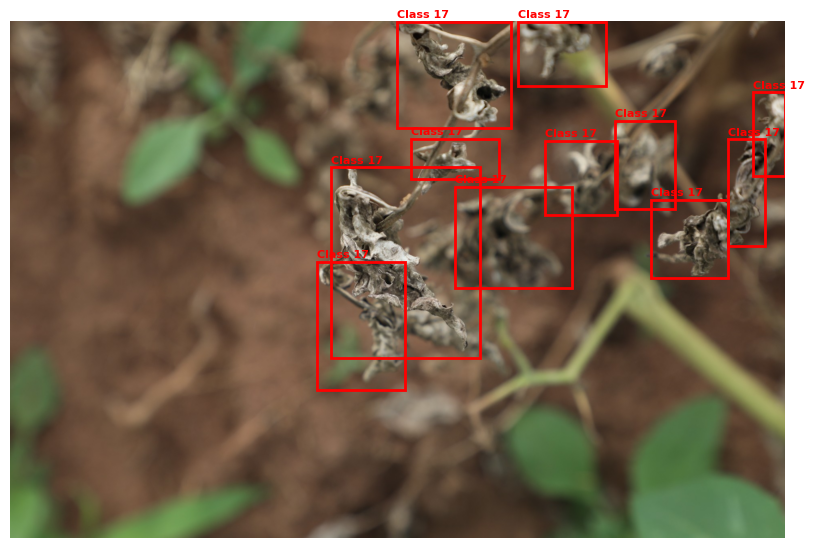

Plotting id_6ne6qc.jpg with 4 bounding boxes.


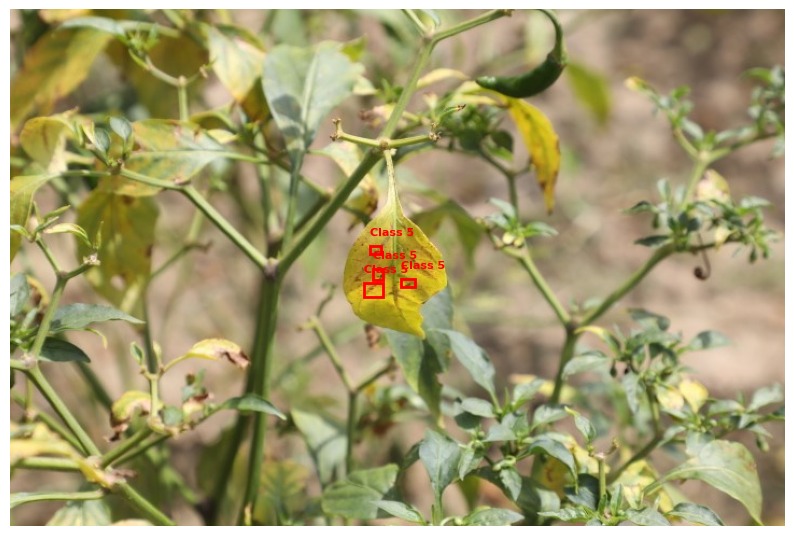

Plotting id_masrex.jpg with 9 bounding boxes.


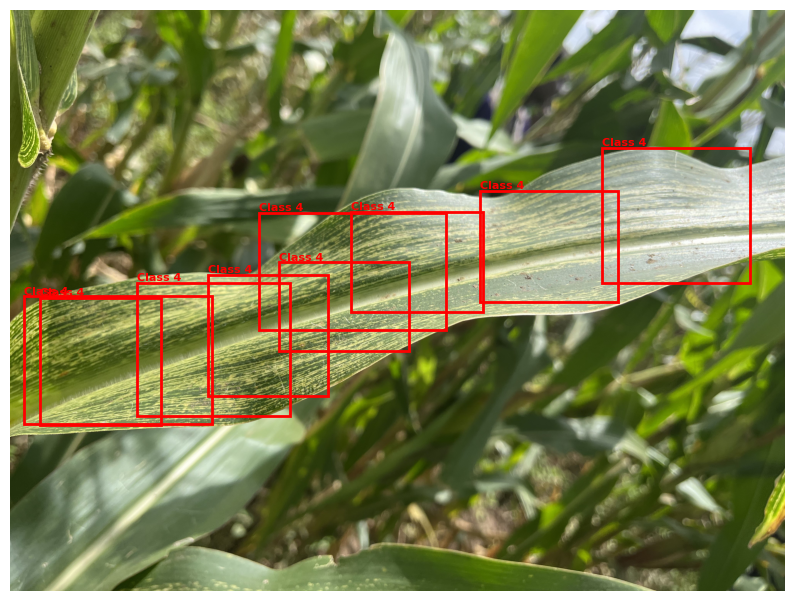

In [48]:
# Plot some images and their bboxes to ensure the conversion was done correctly
def load_annotations(label_path):
    with open(label_path, 'r') as f:
        lines = f.readlines()
    boxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# Function to plot an image with its bounding boxes
def plot_image_with_boxes(image_path, boxes):
    # Load the image
    image = np.array(Image.open(str(image_path)))


    # Get image dimensions
    h, w, _ = image.shape

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Plot each bounding box
    for box in boxes:
        class_id, x_center, y_center, width, height = box
        # Convert YOLO format to corner coordinates
        xmin = int((x_center - width / 2) * w)
        ymin = int((y_center - height / 2) * h)
        xmax = int((x_center + width / 2) * w)
        ymax = int((y_center + height / 2) * h)

        # Draw the bounding box
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                          edgecolor='red', facecolor='none', linewidth=2))
        plt.text(xmin, ymin - 10, f'Class {int(class_id)}', color='red', fontsize=8, weight='bold')

    plt.axis('off')
    plt.show()

# Directories for images and labels
IMAGE_DIR = Path(images_path)
LABEL_DIR = LABELS_DIR

# Plot a few images with their annotations
for image_name in os.listdir(IMAGE_DIR)[:5]:
    image_path = IMAGE_DIR / image_name
    label_path = LABEL_DIR / (image_name.replace('.jpg', '.txt').replace('.png', '.txt'))

    if label_path.exists():
        boxes = load_annotations(label_path)
        print(f"Plotting {image_name} with {len(boxes)} bounding boxes.")
        plot_image_with_boxes(image_path, boxes)


    else:
        print(f"No annotations found for {image_name}.")



### Bounding Boxes visualization by crops and diseases types

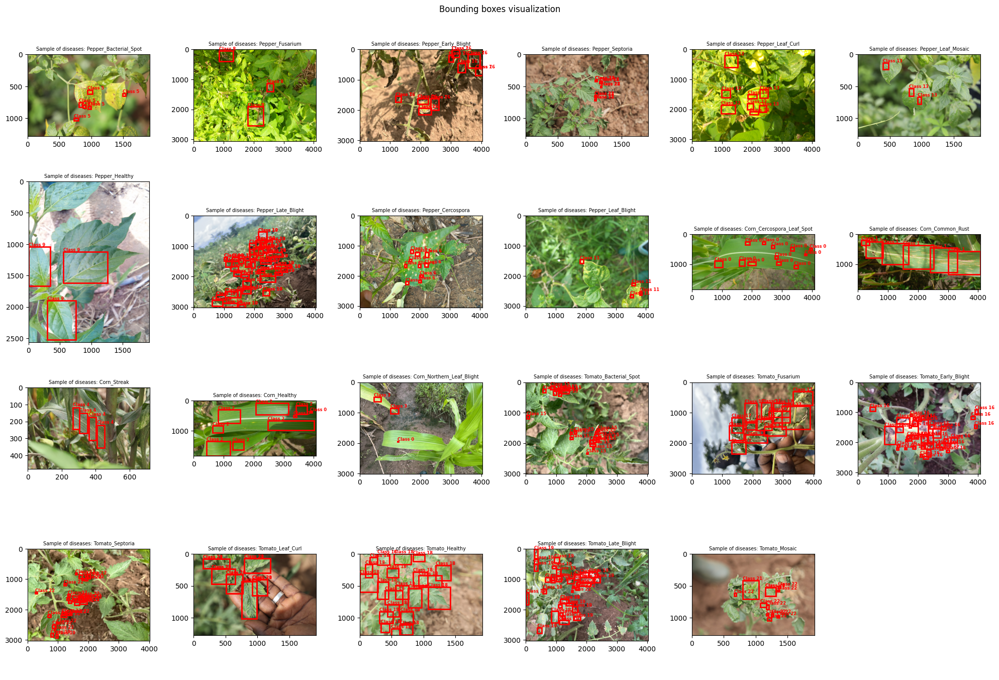

In [49]:
plt.figure(figsize=(20, 14))
ind = 1
for i, crop in enumerate(train.plant.unique()):
    for j, disease in enumerate(train.disease.unique()):
        plt.subplot(4, 6, ind)
        try:
            sple_image_id = random.choice(train.loc[((train.plant==crop) & (train.disease==disease))].index.tolist())
            sple_image_name = train.Image_ID[sple_image_id]
            sple_image_label = train["class"][sple_image_id]
            image = np.array(Image.open(str(images_path+"/"+sple_image_name)))
            # Get image dimensions
            h, w, _ = image.shape

            plt.imshow(image)
            
            label_path = LABEL_DIR / (sple_image_name.replace('.jpg', '.txt').replace('.png', '.txt'))
            boxes = load_annotations(label_path)

            
            # Plot each bounding box
            for box in boxes:
                class_id, x_center, y_center, width, height = box
                # Convert YOLO format to corner coordinates
                xmin = int((x_center - width / 2) * w)
                ymin = int((y_center - height / 2) * h)
                xmax = int((x_center + width / 2) * w)
                ymax = int((y_center + height / 2) * h)

                # Draw the bounding box
                plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                                  edgecolor='red', facecolor='none', linewidth=2))
                plt.text(xmin, ymin - 10, f'Class {int(class_id)}', color='red', fontsize=6, weight='bold')
            plt.title(f"Sample of diseases: {sple_image_label}", fontsize=7)

            ind += 1
        except IndexError:
            pass
plt.suptitle("Bounding boxes visualization")
plt.tight_layout()
plt.axis('off')

plt.show()  

### Bounding boxes dimensions

In [50]:
train["bbox_height"] = (train["ymax"]-train["ymin"])
train["bbox_width"] = (train["xmax"]-train["xmin"])

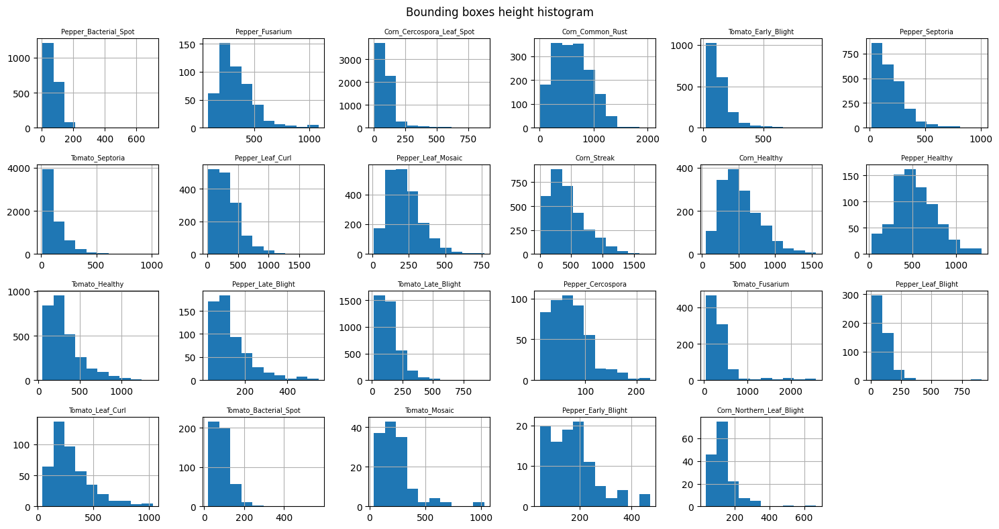

In [51]:
plt.figure(figsize=(15, 8))
ind = 1
for classe in train["class"].unique():
    plt.subplot(4, 6, ind)
    train.loc[train["class"]==classe].bbox_height.hist()

    plt.title(f"{classe}", fontsize=7)

    ind += 1
plt.suptitle("Bounding boxes height histogram")
plt.tight_layout()
plt.show()  

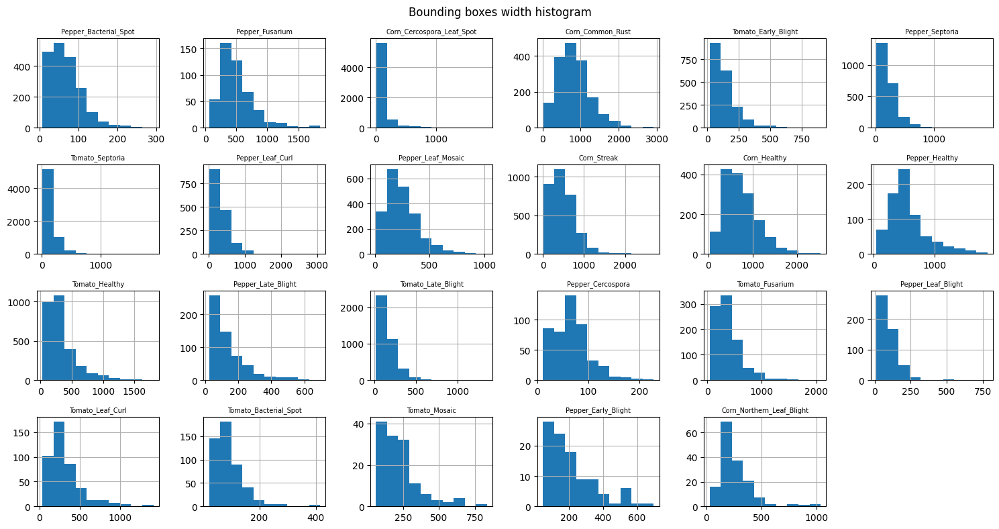

In [52]:
plt.figure(figsize=(15, 8))
ind = 1
for classe in train["class"].unique():
    plt.subplot(4, 6, ind)
    train.loc[train["class"]==classe].bbox_width.hist()

    plt.title(f"{classe}", fontsize=7)

    ind += 1
plt.suptitle("Bounding boxes width histogram")
plt.tight_layout()
plt.show()  

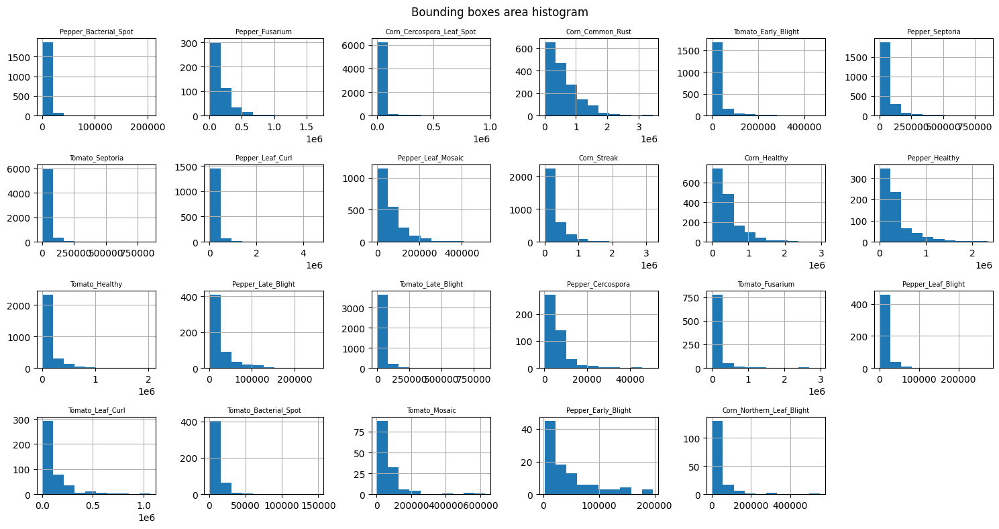

In [53]:
plt.figure(figsize=(15, 8))
ind = 1
for classe in train["class"].unique():
    plt.subplot(4, 6, ind)
    (train.loc[train["class"]==classe].bbox_width*train.loc[train["class"]==classe].bbox_height).hist()

    plt.title(f"{classe}", fontsize=7)

    ind += 1
plt.suptitle("Bounding boxes area histogram")
plt.tight_layout()
plt.show()  

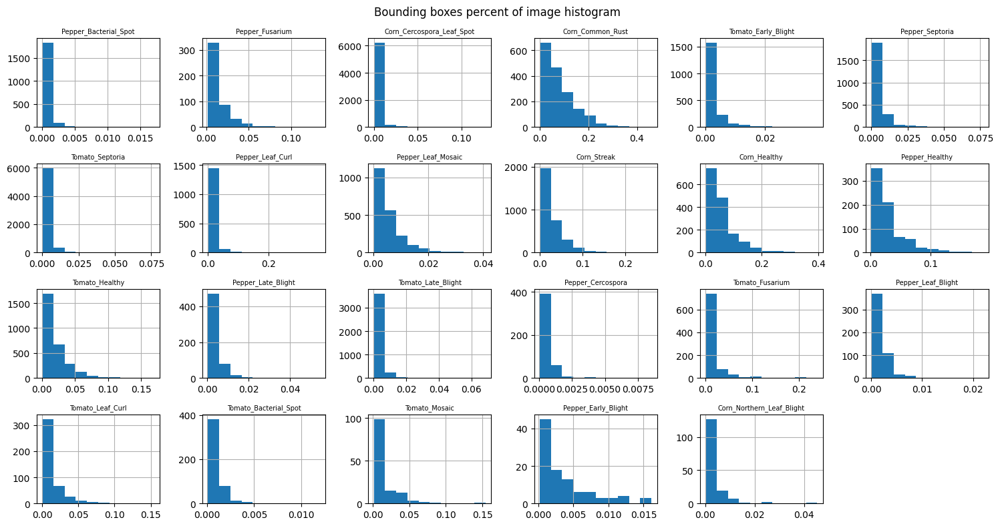

In [54]:
plt.figure(figsize=(15, 8))
ind = 1
for classe in train["class"].unique():
    plt.subplot(4, 6, ind)
    ((train.loc[train["class"]==classe].bbox_width*train.loc[train["class"]==classe].bbox_height)/(train.loc[train["class"]==classe].width*train.loc[train["class"]==classe].height)).hist()

    plt.title(f"{classe}", fontsize=7)

    ind += 1
plt.suptitle("Bounding boxes percent of image histogram")
plt.tight_layout()
plt.show()  

## references

- https://github.com/Abdullahw72/Image-Color-Distribution/blob/master/Image_Color_Distribution_Chart.ipynb
- https://www.kaggle.com/code/shivamb/imaterialist-fashion-eda-object-detection-colors
- Competition Starter Notebook